In [1]:
# RUN THIS IN THE VERY FIRST CELL
%env HF_HUB_OFFLINE=1

import os
os.environ["HF_HUB_OFFLINE"] = "1"

print("Offline mode forced.")


env: HF_HUB_OFFLINE=1
Offline mode forced.


In [13]:
from transformers import Qwen3VLForConditionalGeneration, AutoProcessor
import torch

IMAGE_FACTOR = 28
MIN_PIXELS = 4 * 28 * 28
MAX_PIXELS = 16384 * 28 * 28
MAX_RATIO = 200

VIDEO_MIN_PIXELS = 128 * 28 * 28
VIDEO_MAX_PIXELS = 768 * 28 * 28
FRAME_FACTOR = 2
FPS = 2.0
FPS_MIN_FRAMES = 4
FPS_MAX_FRAMES = 768

import math
from torchvision import transforms
from torchvision.transforms import InterpolationMode
VIDEO_TOTAL_PIXELS = int(float(os.environ.get("VIDEO_MAX_PIXELS", 128000 * 28 * 28 * 0.9)))


def round_by_factor(number: int, factor: int) -> int:
    """Returns the closest integer to 'number' that is divisible by 'factor'."""
    return round(number / factor) * factor


def ceil_by_factor(number: int, factor: int) -> int:
    """Returns the smallest integer greater than or equal to 'number' that is divisible by
    'factor'."""
    return math.ceil(number / factor) * factor


def floor_by_factor(number: int, factor: int) -> int:
    """Returns the largest integer less than or equal to 'number' that is divisible by 'factor'."""
    return math.floor(number / factor) * factor


def smart_resize(
    height: int,
    width: int,
    factor: int = IMAGE_FACTOR,
    min_pixels: int = MIN_PIXELS,
    max_pixels: int = MAX_PIXELS,
) -> tuple[int, int]:
    """
    Rescales the image so that the following conditions are met:

    1. Both dimensions (height and width) are divisible by 'factor'.

    2. The total number of pixels is within the range ['min_pixels', 'max_pixels'].

    3. The aspect ratio of the image is maintained as closely as possible.
    """
    if max(height, width) / min(height, width) > MAX_RATIO:
        raise ValueError(
            f"absolute aspect ratio must be smaller than {MAX_RATIO}, got {max(height, width) / min(height, width)}"
        )
    h_bar = max(factor, round_by_factor(height, factor))
    w_bar = max(factor, round_by_factor(width, factor))
    if h_bar * w_bar > max_pixels:
        beta = math.sqrt((height * width) / max_pixels)
        h_bar = floor_by_factor(height / beta, factor)
        w_bar = floor_by_factor(width / beta, factor)
    elif h_bar * w_bar < min_pixels:
        beta = math.sqrt(min_pixels / (height * width))
        h_bar = ceil_by_factor(height * beta, factor)
        w_bar = ceil_by_factor(width * beta, factor)
    return h_bar, w_bar

class ModelPreprocessor:
    def __init__(
        self, image_factor: int = IMAGE_FACTOR, return_video_sample_fps: bool = False
    ):
        self.image_factor = image_factor
        self.return_video_sample_fps = return_video_sample_fps

    def __call__(self, image, **kwargs):
        _, height, width = image.shape

        nframes = kwargs.get("nframes")

        min_pixels = VIDEO_MIN_PIXELS
        total_pixels = VIDEO_TOTAL_PIXELS
        max_pixels = max(
            min(VIDEO_MAX_PIXELS, total_pixels / nframes * FRAME_FACTOR), int(min_pixels * 1.05)
        )
        max_pixels_supposed = 360 * 420
        # if max_pixels_supposed > max_pixels:
        #     logger.warning(f"The given max_pixels[{max_pixels_supposed}] exceeds limit[{max_pixels}].")
        max_pixels = min(max_pixels_supposed, max_pixels)
        resized_height, resized_width = smart_resize(
            height,
            width,
            factor=self.image_factor,
            min_pixels=min_pixels,
            max_pixels=max_pixels,
        )
        image = transforms.functional.resize(
            image,
            [resized_height, resized_width],
            interpolation=InterpolationMode.BICUBIC,
            antialias=True,
        ).float()
        # if self.return_video_sample_fps:
        #     return video, sample_fps
        return image.unsqueeze(dim=0)
    
def load_video_decord(video_path, n_frames, time_bound):
    from decord import VideoReader, cpu, gpu
    import decord
    import numpy as np
    decord.bridge.set_bridge('torch')
    """
    Loads n_frames from a video between start_sec and end_sec using decord.
    """

    try:
        vr = VideoReader(video_path)
        fps = vr.get_avg_fps()
        
        start_sec, end_sec = time_bound
        
        # Calculate start and end frame indices
        start_frame = int(start_sec * fps)
        end_frame = int(end_sec * fps)
        
        # Clamp values to be within the video's frame count
        total_frames = len(vr)
        start_frame = max(0, start_frame)
        end_frame = min(total_frames - 1, end_frame)
        
        # If end_frame is before start_frame, or they are the same, just get n_frames from start_frame
        if end_frame <= start_frame:
            end_frame = min(start_frame + n_frames - 1, total_frames - 1)
            start_frame = max(0, end_frame - (n_frames - 1))
            
        # Generate n_frames indices between start and end
        frame_indices = np.linspace(start_frame, end_frame, num=n_frames, dtype=int)
        
        # Get the batch of frames
        # .as_tensor() is available because we set the bridge to 'torch'
        # 1. Get the batch as an NDArray, then convert to NumPy array (copies to CPU)
        frames = vr.get_batch(frame_indices)
        
        # Permute to (N, C, H, W) which is standard for PyTorch
        return frames.permute(0, 3, 1, 2)

    except Exception as e:
        print(f"Error loading video {video_path} with decord: {e}")
        # Return a dummy tensor if loading fails
        # You might want to handle this differently (e.g., raise error or return None)
        return torch.empty((n_frames, 3, 224, 224)) # Example dummy shape

class QwenV3VLModel:
    def __init__(self, model_path="Qwen/Qwen3-VL-8B-Instruct"):
        # default: Load the model on the available device(s)
        self.model = Qwen3VLForConditionalGeneration.from_pretrained(
            model_path, dtype="auto", device_map="auto", local_files_only=True
        )
        self.processor = AutoProcessor.from_pretrained(model_path, local_files_only=True)
        self.preprocessor = ModelPreprocessor()
        print(f"Qwen3 model loaded from '{model_path}' on {self.model.device}.")


    def process_video(self, video_path, n_frames, time_bound):
        frames = load_video_decord(video_path, n_frames, time_bound)
        processed_frames = self.preprocessor(frames, nframes=n_frames)
        return processed_frames

    def forward_video_segment(self, video_path, question, time_bound, generation_config , n_frames=16):
        """
        Perform video question answering on a video segment specified by time_bound.
        arguments:
            video_path (str): path to the video file
            question (str): the question to ask about the video content
            time_bound (tuple): tuple (start_time, end_time) in seconds
            n_frames (int): number of frames to sample from the video segment
        returns:
            answer (str): the generated answer text
        """
        selected_frames = load_video_decord(video_path=video_path, n_frames=n_frames, time_bound=time_bound)    # shape (n_frames, C, H, W)
        processed_frames = torch.cat([ModelPreprocessor()(frame, nframes=16) for frame in selected_frames])   # shape (n_frames, C, H, W)

        self.processor.tokenizer.padding_side = "left"

        # Combine messages for batch processing
        message = [{"role": "user", "content": [{"type": "video"}, {"type": "text", "text": question}]}]

        # Preparation for batch inference
        text = self.processor.apply_chat_template(message, tokenize=False, add_generation_prompt=True)

        image_input, video_input = None, processed_frames
        inputs = self.processor(
            text=text,
            images=image_input,
            videos=video_input,
            padding=True,
            return_tensors="pt",
        )
        inputs = inputs.to(self.model.device)

        with torch.inference_mode():
            outputs = self.model.generate(
                **inputs,
                max_new_tokens=500,
                do_sample=False,
                output_scores=True,
                return_dict_in_generate=True,
            )

        output_trimmed = outputs.sequences[:, inputs['input_ids'].shape[1]:]

        output_text = self.processor.batch_decode(
            output_trimmed, skip_special_tokens=True, clean_up_tokenization_spaces=False
        )

        return output_text[0]
    
    def run_qwen_on_chunk(
        self,
        frames: torch.Tensor,   # (N, C, H, W) raw frames
        prompt: str,
        generation_config,
    ) -> str:
        """
        Run Qwen3-VL on a single frame chunk with a text prompt.

        Args:
            frames: Tensor of shape (N, C, H, W)
            prompt: text prompt
            generation_config: generation config for model.generate

        Returns:
            Generated text (str)
        """

        # Preprocess frames one by one (keeps your resizing logic)
        processed_frames = torch.cat(
            [
                self.preprocessor(frame, nframes=frames.shape[0])
                for frame in frames
            ],
            dim=0,  # (N, C, H, W)
        )

        print(f"Processed frames shape: {processed_frames.shape}")

        self.processor.tokenizer.padding_side = "left"


        # Build chat message
        message = [{
            "role": "user",
            "content": [
                {"type": "video"},
                {"type": "text", "text": prompt},
            ],
        }]

        # Apply Qwen chat template
        text = self.processor.apply_chat_template(
            message,
            tokenize=False,
            add_generation_prompt=True,
        )

        # Prepare model inputs
        inputs = self.processor(
            text=text,
            images=None,
            videos=processed_frames,
            padding=True,
            return_tensors="pt",
        )

        inputs = inputs.to(self.model.device)

        # Run inference
        with torch.inference_mode():
            outputs = self.model.generate(
                **inputs,
                **generation_config,
                return_dict_in_generate=True,
            )

        # Remove prompt tokens
        output_trimmed = outputs.sequences[:, inputs["input_ids"].shape[1]:]

        # Decode
        output_text = self.processor.batch_decode(
            output_trimmed,
            skip_special_tokens=True,
            clean_up_tokenization_spaces=False,
        )

        return output_text[0].strip()


In [14]:
import os
from PIL import Image
import torch
from torchvision import transforms
import numpy as np

def load_all_frames_from_folder(folder_path: str):
    """
    Loads all frames from a folder matching the raw output of Decord.
    Output: Tensor (T, C, H, W) with dtype=uint8 and values [0, 255]
    """
    frame_files = sorted(
        f for f in os.listdir(folder_path)
        if f.lower().endswith((".jpg", ".png"))
    )

    frames = []

    for fname in frame_files:
        img = Image.open(os.path.join(folder_path, fname)).convert("RGB")
        
        # 1. Convert PIL to Numpy (H, W, C) - keeps uint8 [0, 255]
        img_np = np.array(img)
        
        # 2. Convert to Torch Tensor
        frame_tensor = torch.from_numpy(img_np)
        
        # 3. Permute dimensions from (H, W, C) to (C, H, W)
        # This matches PyTorch standard format
        frame_tensor = frame_tensor.permute(2, 0, 1)
        
        frames.append(frame_tensor)

    # Stack into (T, C, H, W)
    frames = torch.stack(frames, dim=0)
    
    return frames, frames.shape[0], frame_files

def build_chunks_from_full_video(
    total_frames: int,
    chunk_size: int = 16,
    stride: int | None = None,
):
    """
    Returns list of (start_idx, end_idx) based on full length
    """
    if stride is None:
        stride = chunk_size

    chunks = []
    for start in range(0, total_frames, stride):
        end = start + chunk_size
        if end > total_frames:
            end = total_frames
            start = max(0, end - chunk_size)  # pad last window
        chunks.append((start, end))

        if end == total_frames:
            break

    return chunks

In [ ]:
PROMPT_TEMPLATES = {
    "initial_description": (
        "Briefly describe the action/event that just started in the current video segment. "
        "Focus only on the main actions, actors, and objects, Be careful on their details. "
        "Be concise but complete."
        "Furthermore propose what could be the next event changes, consider also minor details."
        "For instance:"
        "Description: ..."
        "Next event changes: ..."
    ),

    "validity_check": (
        "Your goal is to identify if the same sub-action is ongoing in the current video segment compared to the previous one. "
        "The following is a description of the video so far:\n\n"
        "{previous_description}\n\n"
        "Question: Is this description still accurate for the current video segment?\n"
        "To answer consider also the possible next event changes and analyze if the changes are happening, if they are that means that the description is outdated. "
        "First explain your reasoning briefly, then  "
        "As the last line answer ONLY with 'YES' or 'NO' with no extra characters."
    ),

    "update_description": (
        "The previous description of the video was:\n\n"
        "{previous_description}\n\n"
        "The current subaction .\n"
        "Write an updated description that correctly reflects only the current provided video segment. "
        "Answer only with the updated description. "
        "Focus on the main actions, actors, and objects. Be careful on their details. "
        "Be concise but complete."
        "Furthermore propose what could be the next event changes, consider also minor details."
        "For instance:"
        "Description: ..."
        "Next event changes: ..."

    ),
}

In [ ]:
frames, total_length, frame_files = load_all_frames_from_folder("data/TAPOS/images/val/-EfgHYVRUiQ_s00005_0_501_6_206")
frames, total_length, frame_files = load_all_frames_from_folder("data/TAPOS/images/val/-_cNNioirFE_s00011_0_402_14_971")


In [6]:
def load_gt_annotation_frame(gt_annotation_path, VIDEO_PATH):
    # Extract video_id from VIDEO_PATH
    import os
    import json

    # Extract video_id (remove the frame range part)
    video_id = os.path.splitext(os.path.basename(VIDEO_PATH))[0]
    print("Video ID:", video_id)  # Output: -15OAjLm520

    import pickle
    with open(gt_annotation_path, "rb") as f:
        annotations = pickle.load(f)

    print("Loaded annotations for", len(annotations), "videos.")

    # Search for the matching entry
    video_entry = annotations.get(video_id)

    if video_entry:
        print("Found entry for video:", video_entry)
    else:
        print("No entry found for video_id:", video_id)

    annots_frame = video_entry["substages_myframeidx"]
    return annots_frame

gt_annotation_path ="data/TAPOS/tapos_gt_val.pkl"

In [44]:
VIDEO_PATH = "data/TAPOS/images/val/6OLDzu5TmNc_s00003_0_000_4_425"

frames, total_length, frame_files = load_all_frames_from_folder(VIDEO_PATH)
print(f"Loaded {total_length} frames from {VIDEO_PATH}.")

chunks = build_chunks_from_full_video(
    total_frames=total_length,
    chunk_size=16,
)

load_gt_annotation_frame(gt_annotation_path, VIDEO_PATH)



Loaded 110 frames from data/TAPOS/images/val/6OLDzu5TmNc_s00003_0_000_4_425.
Video ID: 6OLDzu5TmNc_s00003_0_000_4_425
Loaded annotations for 1755 videos.
Found entry for video: {'num_frames': 110, 'path_video': '/workspace/GEBD/data/TAPOS/videos/6OLDzu5TmNc.mp4', 'fps': 24.858757062146893, 'video_duration': 4.425, 'path_frame': '/workspace/GEBD/data/TAPOS/images/val/6OLDzu5TmNc_s00003_0_000_4_425', 'f1_consis': [1.0], 'f1_consis_avg': 1.0, 'substages_myframeidx': [[47, 100]], 'substages_timestamps': [[1.8906818181818181, 4.0227272727272725]]}


[[47, 100]]

In [7]:
model = QwenV3VLModel()

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

Qwen3 model loaded from 'Qwen/Qwen3-VL-8B-Instruct' on cuda:0.


In [12]:
generation_config = dict(max_new_tokens=1024, do_sample=False, temperature=0.6, eos_token_id=151645, pad_token_id=151645)

Chunk 0, Frames 0 to 16:


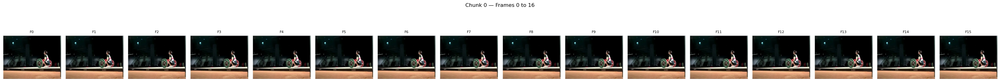

Chunk 1, Frames 16 to 32:


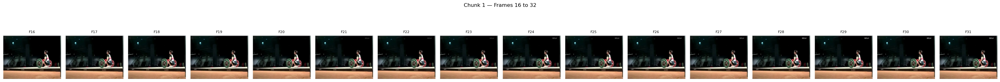

Chunk 2, Frames 32 to 48:


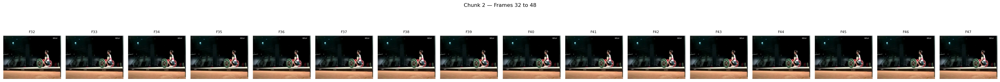

Chunk 3, Frames 48 to 64:


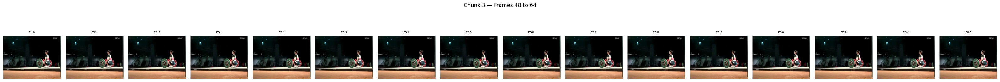

Chunk 4, Frames 64 to 80:


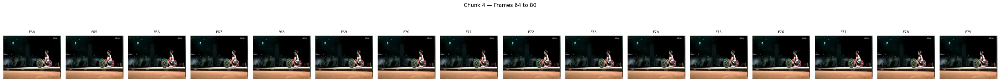

Chunk 5, Frames 80 to 96:


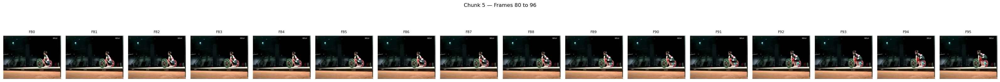

Chunk 6, Frames 96 to 112:


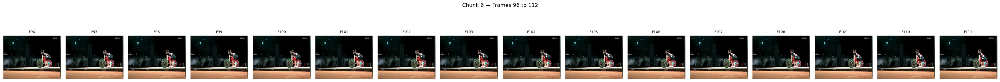

Chunk 7, Frames 112 to 128:


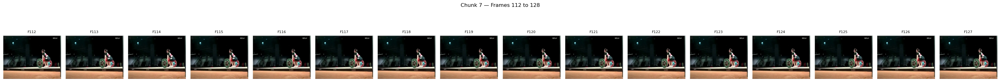

Chunk 8, Frames 128 to 144:


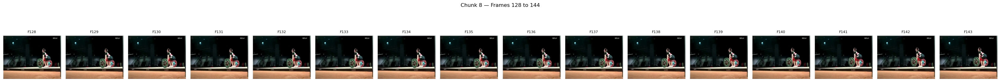

Chunk 9, Frames 144 to 160:


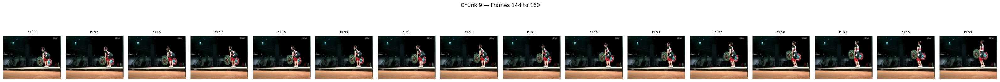

Chunk 10, Frames 160 to 176:


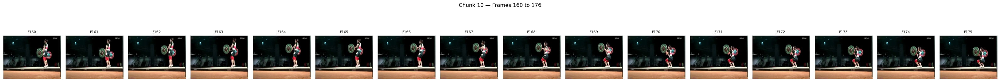

Chunk 11, Frames 176 to 192:


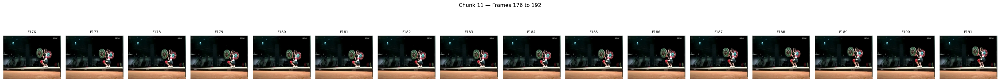

Chunk 12, Frames 192 to 208:


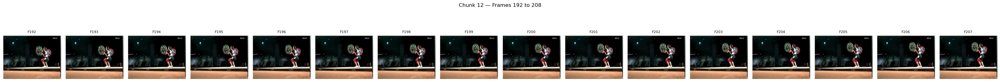

Chunk 13, Frames 208 to 224:


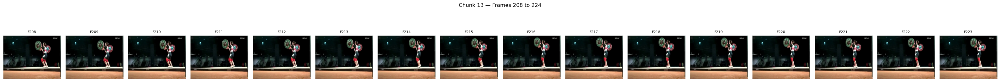

Chunk 14, Frames 224 to 240:


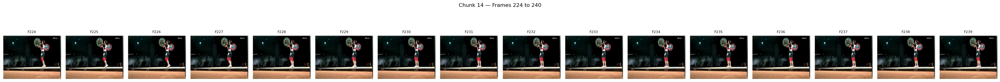

Chunk 15, Frames 240 to 256:


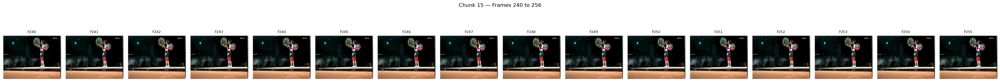

Chunk 16, Frames 256 to 272:


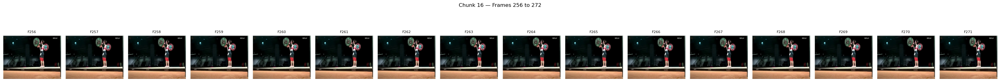

Chunk 17, Frames 272 to 288:


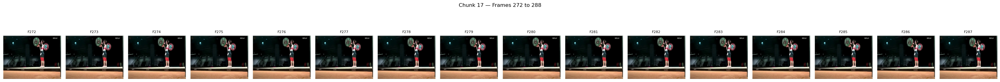

Chunk 18, Frames 288 to 304:


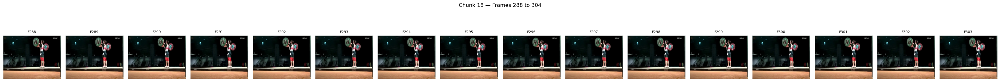

Chunk 19, Frames 304 to 320:


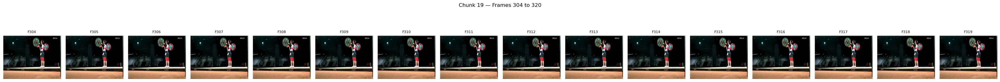

Chunk 20, Frames 320 to 336:


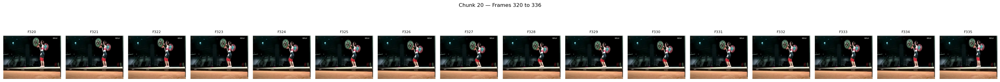

Chunk 21, Frames 336 to 352:


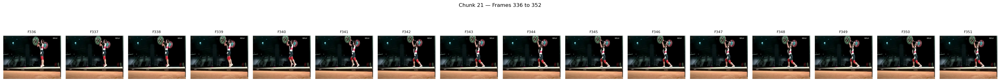

Chunk 22, Frames 352 to 368:


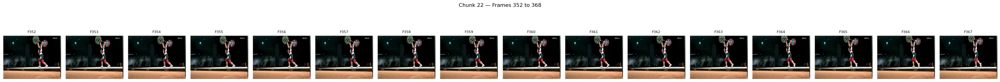

Chunk 23, Frames 368 to 384:


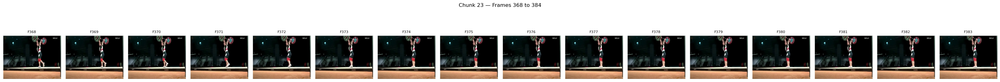

Chunk 24, Frames 384 to 400:


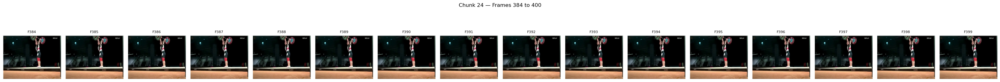

Chunk 25, Frames 400 to 416:


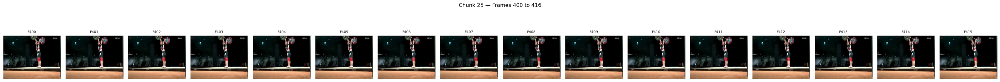

Chunk 26, Frames 416 to 432:


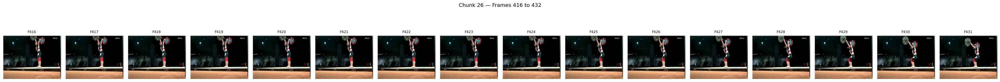

Chunk 27, Frames 421 to 437:


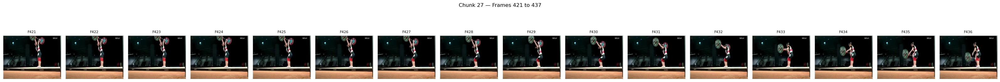

In [27]:
import matplotlib.pyplot as plt

for idx, (start, end) in enumerate(chunks):
    frame_chunk = frames[start:end]  # torch.Size([16, 3, 256, 340])
    print(f"Chunk {idx}, Frames {start} to {end}:")

    fig, axes = plt.subplots(1, frame_chunk.shape[0], figsize=(32, 3))

    for i, ax in enumerate(axes):
        frame = frame_chunk[i].permute(1, 2, 0).cpu().numpy()  # (H, W, C)
        ax.imshow(frame)
        ax.axis("off")
        ax.set_title(f"F{start + i}", fontsize=8)

    plt.suptitle(f"Chunk {idx} — Frames {start} to {end}")
    plt.tight_layout(rect=[0, 0, 1, 0.9])
    plt.show()

In [48]:
current_description = None
timeline = []

for idx, (start, end) in enumerate(chunks):
    frame_chunk = frames[start:end]

    if idx == 0:
        prompt = PROMPT_TEMPLATES["initial_description"]
        current_description = model.run_qwen_on_chunk(frame_chunk, prompt, generation_config)
        print(f"Chunk {idx}, start{start} - end{end}: Initial description: {current_description}")
        timeline.append((start, end, current_description, None))
        continue

    prompt = PROMPT_TEMPLATES["validity_check"].format(
        previous_description=current_description
    )

    answer = model.run_qwen_on_chunk(
        frame_chunk, prompt, generation_config
    )

    print(f"Chunk {idx}, start{start} - end{end}: Validity check answer: {answer}")

    # if answer.upper().startswith("YES"):
    #     continue

    if "YES" in answer.upper():
        timeline.append((start, end, "skipped", answer))
        continue

    prompt = PROMPT_TEMPLATES["update_description"].format(
        previous_description=current_description
    )

    current_description = model.run_qwen_on_chunk(
        frame_chunk, prompt, generation_config
    )

    print(f"Chunk {idx}, start{start} - end{end}: Updated description: {current_description}")

    timeline.append((start, end, current_description, answer))

Processed frames shape: torch.Size([16, 3, 280, 392])
Chunk 0, start0 - end16: Initial description: Description: A female athlete in a blue and white uniform sprints down a red track, approaching a hurdle. She leaps over the hurdle with her right leg extended forward and left leg trailing behind. Two officials in blue shirts stand near the hurdle, observing her run. The track is surrounded by green grass and yellow equipment.

Next event changes: The athlete will continue running down the track after clearing the hurdle, likely approaching the next hurdle or the finish line. Her stride will adjust to maintain speed and rhythm, and the officials may signal or record her performance.
Processed frames shape: torch.Size([16, 3, 280, 392])
Chunk 1, start16 - end32: Validity check answer: The description accurately captures the athlete’s action of clearing the hurdle and the presence of officials. The next event—continuing down the track—is a logical progression and is not yet occurring in t

50,132

In [7]:
import matplotlib.pyplot as plt
import textwrap
import numpy as np
import torch

def plot_timeline_filmstrip_with_reason(frames, timeline, samples=8, max_chunks=40):
    """
    Visualizes the timeline with filmstrips + validity check reasoning.
    
    Args:
        frames: Tensor (T, C, H, W)
        timeline: List of tuples (start, end, description, validity_answer)
        samples: Number of frames per filmstrip.
    """
    
    # Safety limit
    if len(timeline) > max_chunks:
        print(f"Showing first {max_chunks} chunks (out of {len(timeline)})...")
        display_timeline = timeline[:max_chunks]
    else:
        display_timeline = timeline

    # Create figure: Taller rows to accommodate extra text
    fig, axes = plt.subplots(len(display_timeline), 1, figsize=(15, 4.5 * len(display_timeline)))
    
    if len(display_timeline) == 1:
        axes = [axes]

    active_description = "No description available"

    for i, (start, end, desc, reason) in enumerate(display_timeline):
        ax = axes[i]
        
        # --- 1. Filmstrip Generation ---
        real_end = min(end, frames.shape[0])
        if real_end <= start:
            indices = [start] * samples
        else:
            indices = np.linspace(start, real_end - 1, samples, dtype=int)
            
        selected_frames = frames[indices] 
        selected_frames = selected_frames.permute(0, 2, 3, 1).cpu().numpy()
        filmstrip = np.concatenate(selected_frames, axis=1)
        
        ax.imshow(filmstrip)
        
        # --- 2. Logic for Description vs Reason ---
        status_tag = ""
        main_color = "black"
        
        # Check if this is a "Skipped" (Continuation) block
        is_skipped = (desc == "skipped") or (reason and "YES" in str(reason).upper())
        
        if is_skipped:
            # Use the PREVIOUS valid description
            display_desc = f"(Scene Continues) {active_description}"
            status_tag = " [NO CHANGE]"
            main_color = "#555555" # Grey for static scenes
        else:
            # Update the active description
            active_description = desc
            display_desc = desc
            status_tag = " [NEW EVENT]"
            main_color = "black" # Black for new events

        # --- 3. Text Formatting ---
        # A. Format the Main Description
        wrapped_desc = "\n".join(textwrap.wrap(display_desc, width=120))
        
        # B. Format the Validity Reason (if it exists)
        reason_text = ""
        if reason:
            # Clean up the reason text slightly
            clean_reason = str(reason).strip()
            wrapped_reason = "\n".join(textwrap.wrap(f"Model Reasoning: {clean_reason}", width=120))
            reason_text = f"\n\n{wrapped_reason}"
        
        final_label = f"{wrapped_desc}{reason_text}"

        # --- 4. Plotting Labels ---
        # Title
        ax.set_title(f"Chunk {i}: Frames {start} - {end}{status_tag}", 
                     loc='left', fontsize=10, fontweight='bold', color=main_color)
        
        # Description Body
        # We use a secondary color (blue-ish) for the reasoning to distinguish it
        ax.set_xlabel(final_label, fontsize=11, labelpad=8, color=main_color, loc='left')
        
        # Ticks
        ax.set_yticks([])
        ax.set_xticks([])

    plt.tight_layout()
    plt.show()


In [2]:
from models import Qwen3VL
from models.utils import load_all_frames_from_folder, build_chunks_from_full_video

qwen_model = Qwen3VL()

/leonardo/home/userexternal/lzhou001/miniconda3/envs/torch312/lib/python3.12/site-packages/transformers/utils/hub.py:110: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(
2026-01-23 13:01:16.498488: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-01-23 13:01:17.388979: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/leonardo/home/userexternal/lzhou001/miniconda3/envs/torch312/lib/python3.12/site-packages/transformers/models/au

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

In [19]:
PROMPT_TEMPLATES = {
    "initial_description": (
        "Briefly describe the action/event that just started in the current video segment. "
        "Focus only on the main actions and the progress of the action, ignore meaningless detail to determine the current event, Be careful on their details. "
    ),

    "validity_check": (
        "Your goal is to identify if the same action is ongoing in the current video segment compared to the previous one. "
        "Given the previous event description:\n\n"
        "{previous_description}\n\n"
        "Question: Is the current video segment still the same stage of the same event?\n"
        "As the last line answer ONLY with 'YES' or 'NO' with no extra characters."
    ),

    "update_description": (
        "Briefly describe the action/event that just started in the current video segment. "
        "Focus only on the main actions and the progress of the action, ignore meaningless detail to determine the current event, Be careful on their details. "
    ),
}

In [15]:
def load_gt_annotation_frame(gt_annotation_path, VIDEO_PATH):
    # Extract video_id from VIDEO_PATH
    import os
    import json

    # Extract video_id (remove the frame range part)
    video_id = os.path.splitext(os.path.basename(VIDEO_PATH))[0]
    print("Video ID:", video_id)  # Output: -15OAjLm520

    import pickle
    with open(gt_annotation_path, "rb") as f:
        annotations = pickle.load(f)

    print("Loaded annotations for", len(annotations), "videos.")

    # Search for the matching entry
    video_entry = annotations.get(video_id)

    if video_entry:
        print("Found entry for video:", video_entry)
    else:
        print("No entry found for video_id:", video_id)

    annots_frame = video_entry["substages_myframeidx"]
    return annots_frame

gt_annotation_path ="data/TAPOS/tapos_gt_val.pkl"

In [16]:
#VIDEO_PATH = "data/TAPOS/images/val/6OLDzu5TmNc_s00003_0_000_4_425"
VIDEO_PATH = "data/TAPOS/images/val/3HDUOkiQqvw_s00005_15_621_28_639"
load_gt_annotation_frame(gt_annotation_path, VIDEO_PATH)


Video ID: 3HDUOkiQqvw_s00005_15_621_28_639
Loaded annotations for 1755 videos.
Found entry for video: {'num_frames': 390, 'path_video': '/workspace/GEBD/data/TAPOS/videos/3HDUOkiQqvw.mp4', 'fps': 29.958518973728687, 'video_duration': 13.017999999999999, 'path_frame': '/workspace/GEBD/data/TAPOS/images/val/3HDUOkiQqvw_s00005_15_621_28_639', 'f1_consis': [1.0], 'f1_consis_avg': 1.0, 'substages_myframeidx': [[351]], 'substages_timestamps': [[11.716199999999999]]}


[[351]]

In [29]:
import os

BASE_DIR = "data/TAPOS/images/val"
SPLIT_FILE = "random_20_val_split.txt"

def get_video_path_by_id(idx):
    with open(SPLIT_FILE, "r") as f:
        files = [line.strip() for line in f if line.strip()]

    if idx < 0 or idx >= len(files):
        raise IndexError(f"ID {idx} out of range (0-{len(files)-1})")

    return os.path.join(BASE_DIR, files[idx])


# -------- usage --------
VIDEO_ID = 3
VIDEO_PATH = get_video_path_by_id(VIDEO_ID)

VIDEO_PATH = "data/TAPOS/images/val/-EfgHYVRUiQ_s00005_0_501_6_206"

gt_boundary = load_gt_annotation_frame(gt_annotation_path, VIDEO_PATH)

Video ID: -EfgHYVRUiQ_s00005_0_501_6_206
Loaded annotations for 1755 videos.
Found entry for video: {'num_frames': 171, 'path_video': '/workspace/GEBD/data/TAPOS/videos/-EfgHYVRUiQ.mp4', 'fps': 29.97370727432077, 'video_duration': 5.705, 'path_frame': '/workspace/GEBD/data/TAPOS/images/val/-EfgHYVRUiQ_s00005_0_501_6_206', 'f1_consis': [1.0], 'f1_consis_avg': 1.0, 'substages_myframeidx': [[50, 132]], 'substages_timestamps': [[1.6681286549707603, 4.403859649122807]]}


In [30]:
list_frames, list_files, n_frames = load_all_frames_from_folder(VIDEO_PATH)
print(f"Loaded {n_frames} frames from {VIDEO_PATH}.")
print(f"GT Boundaries (frame indices): {gt_boundary}")

chunks = build_chunks_from_full_video(
    total_frames=n_frames,
    chunk_size=16,
)

current_description = None
timeline = []

for idx, (start, end) in enumerate(chunks):
    frame_chunk = list_frames[start:end]

    if idx == 0:
        prompt = PROMPT_TEMPLATES["initial_description"]
        current_description = qwen_model.infer(frame_chunk, prompt, sample_fps=32)
        print(f"Chunk {idx}, start{start} - end{end}: Initial description: {current_description}")
        timeline.append((start, end, current_description, None))
        continue

    prompt = PROMPT_TEMPLATES["validity_check"].format(
        previous_description=current_description
    )

    answer = qwen_model.infer(frame_chunk, prompt, sample_fps=32)

    print(f"Chunk {idx}, start{start} - end{end}: Validity check answer: {answer}")

    # if answer.upper().startswith("YES"):
    #     continue

    if "YES" in answer.upper():
        timeline.append((start, end, "skipped", answer))
        continue

    prompt = PROMPT_TEMPLATES["update_description"].format(
        previous_description=current_description
    )

    current_description = qwen_model.infer(frame_chunk, prompt, sample_fps=32)

    print(f"Chunk {idx}, start{start} - end{end}: Updated description: {current_description}")

    timeline.append((start, end, current_description, answer))

Loaded 171 frames from data/TAPOS/images/val/-EfgHYVRUiQ_s00005_0_501_6_206.
GT Boundaries (frame indices): [[50, 132]]
Chunk 0, start0 - end16: Initial description: A female pole vaulter begins her approach, running down the track with the pole in her right hand. She is focused and determined as she prepares to plant the pole and clear the bar.
Chunk 1, start16 - end32: Validity check answer: YES
Chunk 2, start32 - end48: Validity check answer: YES
Chunk 3, start48 - end64: Validity check answer: NO
Chunk 3, start48 - end64: Updated description: An athlete in a blue uniform is in mid-air, having just cleared a high jump bar. They are upside down, with their legs extended upwards and their arms reaching towards the bar. The athlete is in the process of completing the jump, with their body positioned to land safely on the mat below.
Chunk 4, start64 - end80: Validity check answer: YES
Chunk 5, start80 - end96: Validity check answer: YES
Chunk 6, start96 - end112: Validity check answer: 

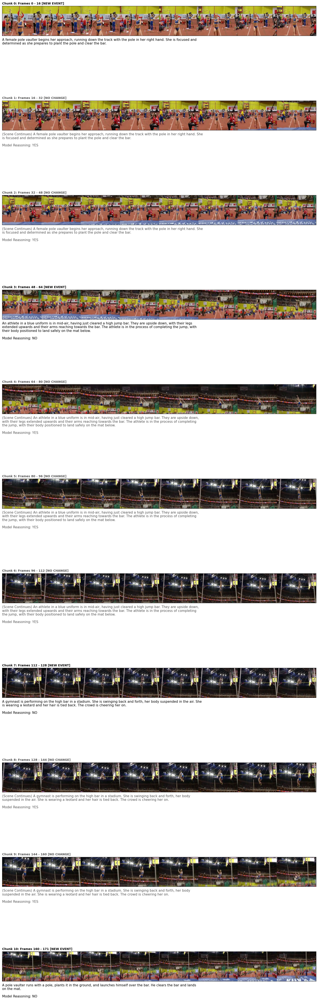

In [31]:
from models.utils import plot_timeline_filmstrip
plot_timeline_filmstrip(list_frames, timeline)